Researcher - TRISHUL CHOWDHURY

In [ ]:
import numpy as np 
import pandas as pd

In [4]:
import os
for dirname, _, filenames in os.walk(r'C:\Users\Trishul Chowdhury\Desktop\final code\ljmu_implementation\final draft'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

In [1]:
#importing all dependencies.
from sentence_transformers import SentenceTransformer
import os
import json
import pandas as pd
from tqdm import tqdm
import numpy as np
import nltk
from nltk.corpus import wordnet
from nltk.stem import WordNetLemmatizer, SnowballStemmer
from nltk.stem.porter import *
import re
import matplotlib.pyplot as plt
from nltk.corpus import stopwords 

In [6]:
import gensim
from gensim.utils import simple_preprocess
from gensim import corpora, models
from gensim.parsing.preprocessing import STOPWORDS

In [8]:
import datetime
import time
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import seaborn as sns
%matplotlib inline
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

In [9]:
meta = pd.read_csv(r"C:\Users\Trishul Chowdhury\Desktop\final Thesis\final code\ljmu_implementation\final draft\amazon_200.csv")
print(meta.shape)

(34660, 21)


C:\Users\Trishul Chowdhury\anaconda3\envs\tensorflow\lib\site-packages\IPython\core\interactiveshell.py:3147: DtypeWarning: Columns (1,10) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [10]:
meta.rename(columns={"name":"Product Name","reviews.doRecommend":"recommendation_indicator","reviews.rating":"reviews_rating","reviews.text":"reviews_text"},inplace= True)

In [11]:
amazon_review_data=meta
len(meta)

34660

In [12]:
import numpy as np
a=pd.DataFrame(amazon_review_data.isnull().sum())
a["Percentage_null"]=((a[0]/len(meta))*100).round()
a

,0,Percentage_null
id,0,0.0
Product Name,6760,20.0
asins,2,0.0
brand,0,0.0
categories,0,0.0
keys,0,0.0
manufacturer,0,0.0
reviews.date,39,0.0
reviews.dateAdded,10621,31.0
reviews.dateSeen,0,0.0


In [13]:
b=a.loc[["Product Name","brand","categories","recommendation_indicator","reviews_text","reviews_rating"]]
b

,0,Percentage_null
Product Name,6760,20.0
brand,0,0.0
categories,0,0.0
recommendation_indicator,594,2.0
reviews_text,1,0.0
reviews_rating,33,0.0


In [14]:
b.index.names = ['Features Name']
b

,0,Percentage_null
Features Name,,
Product Name,6760,20.0
brand,0,0.0
categories,0,0.0
recommendation_indicator,594,2.0
reviews_text,1,0.0
reviews_rating,33,0.0


In [19]:
from symspellpy import SymSpell, Verbosity
import pkg_resources

In [20]:
#sym spell package
sym_spell = SymSpell(max_dictionary_edit_distance=3, prefix_length=7)
dictionary_path = pkg_resources.resource_filename(
    "symspellpy", "frequency_dictionary_en_82_765.txt")
if sym_spell.word_count:
    pass
else:
    sym_spell.load_dictionary(dictionary_path, term_index=0, count_index=1)

In [21]:
from spacy_langdetect import LanguageDetector

In [77]:
import pkg_resources
from symspellpy import SymSpell, Verbosity

In [22]:
from collections import Counter
from sklearn.metrics import silhouette_score
import umap
import matplotlib.pyplot as plt
from wordcloud import WordCloud
from gensim.models.coherencemodel import CoherenceModel
import numpy as np
import os

In [23]:
from stop_words import get_stop_words
from nltk.stem.porter import PorterStemmer
import re
import nltk
from nltk.tokenize import word_tokenize
from langdetect import detect
#from language_detector import detect_language
import pkg_resources
from symspellpy import SymSpell, Verbosity

In [84]:
import pkg_resources
from symspellpy import SymSpell, Verbosity

In [88]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.cluster import KMeans
from gensim import corpora
import gensim
import numpy as np
from datetime import datetime

In [26]:
meta.columns

Index(['id', 'Product Name', 'asins', 'brand', 'categories', 'keys',
       'manufacturer', 'reviews.date', 'reviews.dateAdded', 'reviews.dateSeen',
       'reviews.didPurchase', 'recommendation_indicator', 'reviews.id',
       'reviews.numHelpful', 'reviews_rating', 'reviews.sourceURLs',
       'reviews_text', 'reviews.title', 'reviews.userCity',
       'reviews.userProvince', 'reviews.username'],
      dtype='object')

In [24]:
type(meta)

pandas.core.frame.DataFrame

In [27]:
meta["reviews_text"]

0        This product so far has not disappointed. My c...
1        great for beginner or experienced person. Boug...
2        Inexpensive tablet for him to use and learn on...
3        I've had my Fire HD 8 two weeks now and I love...
4        I bought this for my grand daughter when she c...
                               ...                        
34655    This is not appreciably faster than any other ...
34656    Amazon should include this charger with the Ki...
34657    Love my Kindle Fire but I am really disappoint...
34658    I was surprised to find it did not come with a...
34659    to spite the fact that i have nothing but good...
Name: reviews_text, Length: 34660, dtype: object

In [28]:
meta.rename(columns={'reviews_text': 'reviews'}, inplace=True)

In [29]:
df=pd.DataFrame(meta["reviews"])

In [30]:
df.head(3)

,reviews
0,This product so far has not disappointed. My c...
1,great for beginner or experienced person. Boug...
2,Inexpensive tablet for him to use and learn on...


In [31]:
df.shape

(34660, 1)

## Preprocessing 

In [32]:
###################################
#### sentence level preprocess ####
###################################

# lowercase + base filter
# some basic normalization
def f_base(s):
    """
    :param s: string to be processed
    :return: processed string: see comments in the source code for more info
    """
    # normalization 1: xxxThis is a --> xxx. This is a (missing delimiter)
    s = re.sub(r'([a-z])([A-Z])', r'\1\. \2', s)  # before lower case
    # normalization 2: lower case
    s = s.lower()
    # normalization 3: "&gt", "&lt"
    s = re.sub(r'&gt|&lt', ' ', s)
    # normalization 4: letter repetition (if more than 2)
    s = re.sub(r'([a-z])\1{2,}', r'\1', s)
    # normalization 5: non-word repetition (if more than 1)
    s = re.sub(r'([\W+])\1{1,}', r'\1', s)
    # normalization 6: string * as delimiter
    s = re.sub(r'\*|\W\*|\*\W', '. ', s)
    # normalization 7: stuff in parenthesis, assumed to be less informal
    s = re.sub(r'\(.*?\)', '. ', s)
    # normalization 8: xxx[?!]. -- > xxx.
    s = re.sub(r'\W+?\.', '.', s)
    # normalization 9: [.?!] --> [.?!] xxx
    s = re.sub(r'(\.|\?|!)(\w)', r'\1 \2', s)
    # normalization 10: ' ing ', noise text
    s = re.sub(r' ing ', ' ', s)
    # normalization 11: noise text
    s = re.sub(r'product received for free[.| ]', ' ', s)
    # normalization 12: phrase repetition
    s = re.sub(r'(.{2,}?)\1{1,}', r'\1', s)

    return s.strip()


# language detection
def f_lan(s):
    """
    :param s: string to be processed
    :return: boolean (s is English)
    """

    # some reviews are actually english but biased toward french
    return detect(s) in {'English', 'French','Spanish','Chinese'}


###############################
#### word level preprocess ####
###############################

# filtering out punctuations and numbers
def f_punct(w_list):
    """
    :param w_list: word list to be processed
    :return: w_list with punct and number filter out
    """
    return [word for word in w_list if word.isalpha()]


# selecting nouns
def f_noun(w_list):
    """
    :param w_list: word list to be processed
    :return: w_list with only nouns selected
    """
    return [word for (word, pos) in nltk.pos_tag(w_list) if pos[:2] == 'NN']


# typo correction
def f_typo(w_list):
    """
    :param w_list: word list to be processed
    :return: w_list with typo fixed by symspell. words with no match up will be dropped
    """
    w_list_fixed = []
    for word in w_list:
        suggestions = sym_spell.lookup(word, Verbosity.CLOSEST, max_edit_distance=3)
        if suggestions:
            w_list_fixed.append(suggestions[0].term)
        else:
            pass
    return w_list_fixed


# stemming if doing word-wise
p_stemmer = PorterStemmer()


def f_stem(w_list):
    """
    :param w_list: word list to be processed
    :return: w_list with stemming
    """
    return [p_stemmer.stem(word) for word in w_list]


# filtering out stop words
# create English stop words list

stop_words = (list(
    set(get_stop_words('en'))
    |set(get_stop_words('es'))
    |set(get_stop_words('de'))
    |set(get_stop_words('it'))
    |set(get_stop_words('ca'))
    #|set(get_stop_words('cy'))
    |set(get_stop_words('pt'))
    #|set(get_stop_words('tl'))
    |set(get_stop_words('pl'))
    #|set(get_stop_words('et'))
    |set(get_stop_words('da'))
    |set(get_stop_words('ru'))
    #|set(get_stop_words('so'))
    |set(get_stop_words('sv'))
    |set(get_stop_words('sk'))
    #|set(get_stop_words('cs'))
    |set(get_stop_words('nl'))
    #|set(get_stop_words('sl'))
    #|set(get_stop_words('no'))
    #|set(get_stop_words('zh-cn'))
))


def f_stopw(w_list):
    """
    filtering out stop words
    """
    return [word for word in w_list if word not in stop_words]


def preprocess_sent(rw):
    """
    Get sentence level preprocessed data from raw review texts
    :param rw: review to be processed
    :return: sentence level pre-processed review
    """
    s = f_base(rw)
    #if not f_lan(s):
    #    return None
    return s


def preprocess_word(s):
    """
    Get word level preprocessed data from preprocessed sentences
    including: remove punctuation, select noun, fix typo, stem, stop_words
    :param s: sentence to be processed
    :return: word level pre-processed review
    """
    if not s:
        return None
    w_list = word_tokenize(s)
    w_list = f_punct(w_list)
    w_list = f_noun(w_list)
    w_list = f_typo(w_list)
    w_list = f_stem(w_list)
    w_list = f_stopw(w_list)

    return w_list

In [39]:
## main preprocessing function

In [33]:
def preprocess(docs, samp_size=None):
    """
    Preprocess the data
    """
    if not samp_size:
        samp_size = 100

    print('Preprocessing raw texts ...')
    n_docs = len(docs)
    sentences = []  # sentence level preprocessed
    token_lists = []  # word level preprocessed
    idx_in = []  # index of sample selected
    #     samp = list(range(100))
    samp = np.random.choice(n_docs, samp_size)
    for i, idx in enumerate(samp):
        sentence = preprocess_sent(docs[idx])
        token_list = preprocess_word(sentence)
        if token_list:
            idx_in.append(idx)
            sentences.append(sentence)
            token_lists.append(token_list)
        print('{} %'.format(str(np.round((i + 1) / len(samp) * 100, 2))), end='\r')
    print('Preprocessing raw texts. Done!')
    return sentences, token_lists, idx_in

In [34]:
data = df 
print(data.shape,data)


(34660, 1)                                                  reviews
0      This product so far has not disappointed. My c...
1      great for beginner or experienced person. Boug...
2      Inexpensive tablet for him to use and learn on...
3      I've had my Fire HD 8 two weeks now and I love...
4      I bought this for my grand daughter when she c...
...                                                  ...
34655  This is not appreciably faster than any other ...
34656  Amazon should include this charger with the Ki...
34657  Love my Kindle Fire but I am really disappoint...
34658  I was surprised to find it did not come with a...
34659  to spite the fact that i have nothing but good...

[34660 rows x 1 columns]


In [35]:
data.head(2)

,reviews
0,This product so far has not disappointed. My c...
1,great for beginner or experienced person. Boug...


In [36]:
data = data.fillna('')  # only the comments has NaN's
rws = data["reviews"]
sentences, token_lists, idx_in = preprocess(rws,samp_size=50000)

Preprocessing raw texts ...
Preprocessing raw texts. Done!


In [37]:
len(sentences)

49412

In [38]:
sentences[0:4]

['great starter tablet for any one looking to not spend much money.',
 'love it makes reading a pleasure. easy on eyes, able to take anywhere, simple to use.',
 'useful in the kitchen, and for home automation. would compare it to google home before picking one up at this time of the year.',
 'great e reader. preffered the brighter display of the voyage over the paperwhite. happy with 3g connection for all time access.']

In [39]:
len(token_lists)

49412

In [40]:
token_lists[0:10]

[['tablet', 'money'],
 ['pleasur', 'easi', 'eye'],
 ['kitchen', 'home', 'autom', 'home', 'time', 'year'],
 ['reader', 'brighter', 'display', 'voyag', 'connect', 'time', 'access'],
 ['function', 'life', 'book', 'phone', 'recommend', 'anyon', 'night', 'eye'],
 ['amazon',
  'echo',
  'product',
  'lot',
  'fun',
  'morn',
  'joke',
  'day',
  'item',
  'lot',
  'fun',
  'music',
  'playlist'],
 ['fire', 'stick', 'issu', 'connect', 'money', 'thing', 'work', 'champ'],
 ['gift', 'granddaught', 'kindl', 'gener', 'lot', 'option'],
 ['bought', 'kid', 'purchas'],
 ['kindl',
  'kindl',
  'job',
  'lightweight',
  'sturdi',
  'bag',
  'case',
  'chanc',
  'descript',
  'book',
  'batteri',
  'life',
  'screen',
  'font',
  'side',
  'screen',
  'screen',
  'bright',
  'control',
  'screen',
  'kindl',
  'job',
  'anyth']]

In [41]:
######################## PRE PROCESSING DONE FOR THIS MODEL ####################

In [42]:
###################################

## Advanced EDA

In [70]:
df2=pd.read_csv(r"C:\Users\Trishul Chowdhury\Desktop\final Thesis\final code\ljmu_implementation\final draft\amazon_200.csv") 
print("Shape of data=>",df2.shape)

C:\Users\Trishul Chowdhury\anaconda3\envs\tensorflow\lib\site-packages\IPython\core\interactiveshell.py:3147: DtypeWarning: Columns (1,10) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


Shape of data=> (34660, 21)


In [71]:
for index,text in enumerate(df2['reviews.text'][35:40]):
    print('Review %d:\n'%(index+1),text)

Review 1:
 I love everything about this tablet! The imaging is sharp and clear. It's fast and light weight. Love it!
Review 2:
 Overall a nice product for traveling purposes Value for money
Review 3:
 My children love this table great quality of pictures, excellent camera
Review 4:
 I bought 3 tablets and my family was not disappointed.
Review 5:
 Great tablet fast screen good size never gives me problem


In [73]:
# Dictionary of English Contractions
contractions_dict = { "ain't": "are not","'s":" is","aren't": "are not",
                     "can't": "cannot","can't've": "cannot have",
                     "'cause": "because","could've": "could have","couldn't": "could not",
                     "couldn't've": "could not have", "didn't": "did not","doesn't": "does not",
                     "don't": "do not","hadn't": "had not","hadn't've": "had not have",
                     "hasn't": "has not","haven't": "have not","he'd": "he would",
                     "he'd've": "he would have","he'll": "he will", "he'll've": "he will have",
                     "how'd": "how did","how'd'y": "how do you","how'll": "how will",
                     "I'd": "I would", "I'd've": "I would have","I'll": "I will",
                     "I'll've": "I will have","I'm": "I am","I've": "I have", "isn't": "is not",
                     "it'd": "it would","it'd've": "it would have","it'll": "it will",
                     "it'll've": "it will have", "let's": "let us","ma'am": "madam",
                     "mayn't": "may not","might've": "might have","mightn't": "might not", 
                     "mightn't've": "might not have","must've": "must have","mustn't": "must not",
                     "mustn't've": "must not have", "needn't": "need not",
                     "needn't've": "need not have","o'clock": "of the clock","oughtn't": "ought not",
                     "oughtn't've": "ought not have","shan't": "shall not","sha'n't": "shall not",
                     "shan't've": "shall not have","she'd": "she would","she'd've": "she would have",
                     "she'll": "she will", "she'll've": "she will have","should've": "should have",
                     "shouldn't": "should not", "shouldn't've": "should not have","so've": "so have",
                     "that'd": "that would","that'd've": "that would have", "there'd": "there would",
                     "there'd've": "there would have", "they'd": "they would",
                     "they'd've": "they would have","they'll": "they will",
                     "they'll've": "they will have", "they're": "they are","they've": "they have",
                     "to've": "to have","wasn't": "was not","we'd": "we would",
                     "we'd've": "we would have","we'll": "we will","we'll've": "we will have",
                     "we're": "we are","we've": "we have", "weren't": "were not","what'll": "what will",
                     "what'll've": "what will have","what're": "what are", "what've": "what have",
                     "when've": "when have","where'd": "where did", "where've": "where have",
                     "who'll": "who will","who'll've": "who will have","who've": "who have",
                     "why've": "why have","will've": "will have","won't": "will not",
                     "won't've": "will not have", "would've": "would have","wouldn't": "would not",
                     "wouldn't've": "would not have","y'all": "you all", "y'all'd": "you all would",
                     "y'all'd've": "you all would have","y'all're": "you all are",
                     "y'all've": "you all have", "you'd": "you would","you'd've": "you would have",
                     "you'll": "you will","you'll've": "you will have", "you're": "you are",
                     "you've": "you have"}


In [74]:
# Regular expression for finding contractions
contractions_re=re.compile('(%s)' % '|'.join(contractions_dict.keys()))

# Function for expanding contractions
def expand_contractions(text,contractions_dict=contractions_dict):
    def replace(match):
        return contractions_dict[match.group(0)]
    return contractions_re.sub(replace, text)

# Expanding Contractions in the reviews
#df["reviews.text"]=df["reviews.text"].apply(lambda x:expand_contractions(x))

In [75]:
df2.columns

Index(['id', 'name', 'asins', 'brand', 'categories', 'keys', 'manufacturer',
       'reviews.date', 'reviews.dateAdded', 'reviews.dateSeen',
       'reviews.didPurchase', 'reviews.doRecommend', 'reviews.id',
       'reviews.numHelpful', 'reviews.rating', 'reviews.sourceURLs',
       'reviews.text', 'reviews.title', 'reviews.userCity',
       'reviews.userProvince', 'reviews.username'],
      dtype='object')

In [76]:
df2["reviews.text"].head(10)

0    This product so far has not disappointed. My c...
1    great for beginner or experienced person. Boug...
2    Inexpensive tablet for him to use and learn on...
3    I've had my Fire HD 8 two weeks now and I love...
4    I bought this for my grand daughter when she c...
5    This amazon fire 8 inch tablet is the perfect ...
6    Great for e-reading on the go, nice and light ...
7    I gave this as a Christmas gift to my inlaws, ...
8    Great as a device to read books. I like that i...
9    I love ordering books and reading them with th...
Name: reviews.text, dtype: object

In [77]:
df2.rename(columns={'reviews.text' :"reviews"},inplace=True)

In [78]:
df2["cleaned"]=df2['reviews'].str.lower()

In [79]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 34660 entries, 0 to 34659
Data columns (total 22 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   id                    34660 non-null  object 
 1   name                  27900 non-null  object 
 2   asins                 34658 non-null  object 
 3   brand                 34660 non-null  object 
 4   categories            34660 non-null  object 
 5   keys                  34660 non-null  object 
 6   manufacturer          34660 non-null  object 
 7   reviews.date          34621 non-null  object 
 8   reviews.dateAdded     24039 non-null  object 
 9   reviews.dateSeen      34660 non-null  object 
 10  reviews.didPurchase   1 non-null      object 
 11  reviews.doRecommend   34066 non-null  object 
 12  reviews.id            1 non-null      float64
 13  reviews.numHelpful    34131 non-null  float64
 14  reviews.rating        34627 non-null  float64
 15  reviews.sourceURLs 

In [80]:
df2["cleaned"]=df2.cleaned.apply(str)

In [81]:
#Remove digits and words containing digits
df2['cleaned']=df2['cleaned'].apply(lambda x: re.sub('\w*\d\w*','', x))

In [82]:
#Remove Punctuations
import string
df2['cleaned']=df2['cleaned'].apply(lambda x: re.sub('[%s]' % re.escape(string.punctuation), '', x))

# Removing extra spaces
df2['cleaned']=df2['cleaned'].apply(lambda x: re.sub(' +',' ',x))

In [83]:
for index,text in enumerate(df2['cleaned'][35:40]):
    print('Review %d:\n'%(index+1),text)

Review 1:
 i love everything about this tablet the imaging is sharp and clear its fast and light weight love it
Review 2:
 overall a nice product for traveling purposes value for money
Review 3:
 my children love this table great quality of pictures excellent camera
Review 4:
 i bought tablets and my family was not disappointed
Review 5:
 great tablet fast screen good size never gives me problem


In [170]:
!pip install en_core_web_sm

ERROR: Could not find a version that satisfies the requirement en_core_web_sm
ERROR: No matching distribution found for en_core_web_sm


In [85]:
import en_core_web_sm
nlp = en_core_web_sm.load()

In [86]:
# Importing spacy
import spacy

#Lemmatization with stopwords removal
df2['lemmatized']=df2['cleaned'].apply(lambda x: ' '.join([token.lemma_ for token in list(nlp(x)) if (token.is_stop==False)]))

In [87]:
df_grouped=df2[['name','lemmatized']].groupby(by='name').agg(lambda x:' '.join(x))
df_grouped.head()

,lemmatized
name,
"All-New Fire HD 8 Tablet, 8 HD Display, Wi-Fi, 16 GB - Includes Special Offers, Magenta",product far disappoint child love use like abi...
"All-New Fire HD 8 Tablet, 8 HD Display, Wi-Fi, 32 GB - Includes Special Offers, Magenta",wake nice surprise morning new kindle gift ipa...
"All-New Kindle E-reader - Black, 6 Glare-Free Touchscreen Display, Wi-Fi - Includes Special Offers,,",work good purchase charger well spec amazon ch...
"Amazon - Amazon Tap Portable Bluetooth and Wi-Fi Speaker - Black,,,\r\nAmazon - Amazon Tap Portable Bluetooth and Wi-Fi Speaker - Black,,,",love buy buy parent easy start walk right inst...
"Amazon - Fire 16GB (5th Gen, 2015 Release) - Black,,,\r\nAmazon - Fire 16GB (5th Gen, 2015 Release) - Black,,,",love kindle voyage speaker audio book change s...


In [88]:
#Document Term Matrix

from sklearn.feature_extraction.text import CountVectorizer 

cv=CountVectorizer(analyzer='word')

data=cv.fit_transform(df_grouped['lemmatized'])
df_dtm = pd.DataFrame(data.toarray(), columns=cv.get_feature_names())
df_dtm.index=df_grouped.index
df_dtm.head(3)

,aa,aaa,aamazon,abandon,abattery,abc,abcmouse,abcmousecom,abcs,abd,...,zip,zippy,zone,zoo,zoom,zwave,ï¼,œdualbattery,œgo,œxâ
name,,,,,,,,,,,,,,,,,,,,,
"All-New Fire HD 8 Tablet, 8 HD Display, Wi-Fi, 16 GB - Includes Special Offers, Magenta",0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
"All-New Fire HD 8 Tablet, 8 HD Display, Wi-Fi, 32 GB - Includes Special Offers, Magenta",0,0,0,0,0,0,0,0,0,0,...,1,1,0,0,0,0,0,0,0,0
"All-New Kindle E-reader - Black, 6 Glare-Free Touchscreen Display, Wi-Fi - Includes Special Offers,,",0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


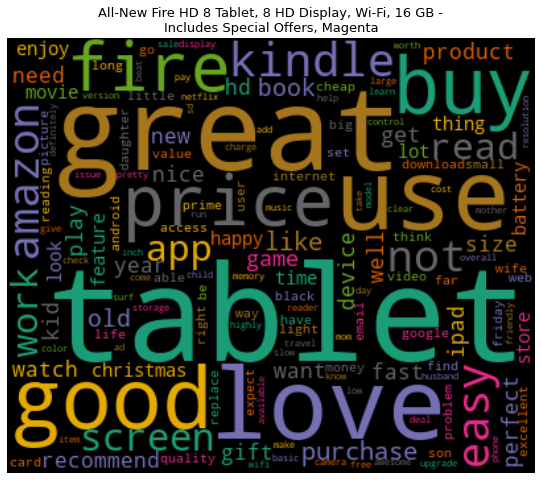

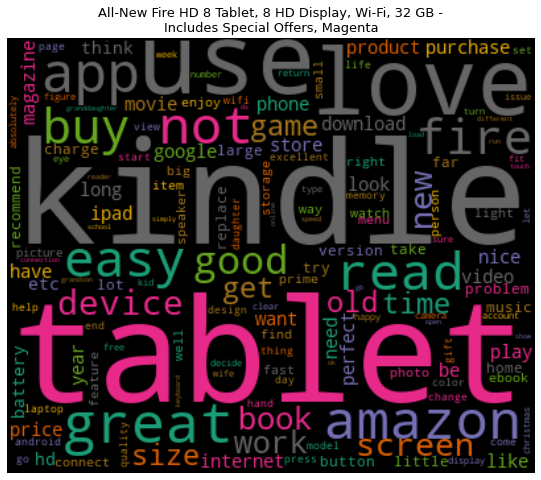

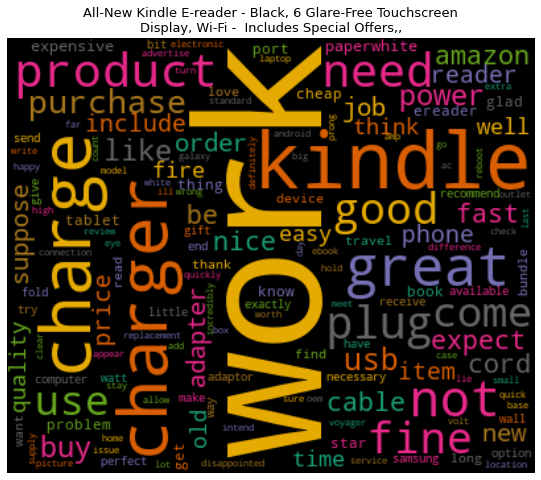

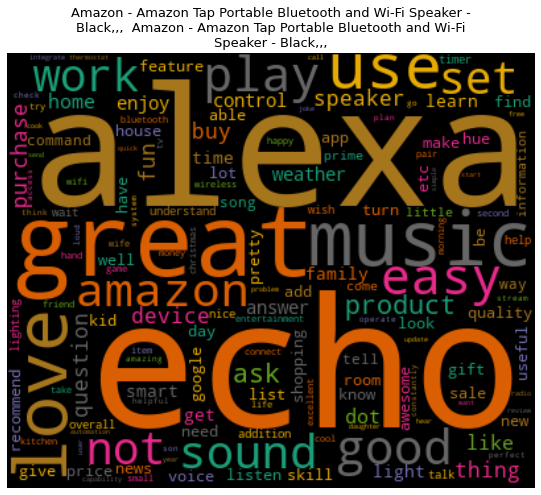

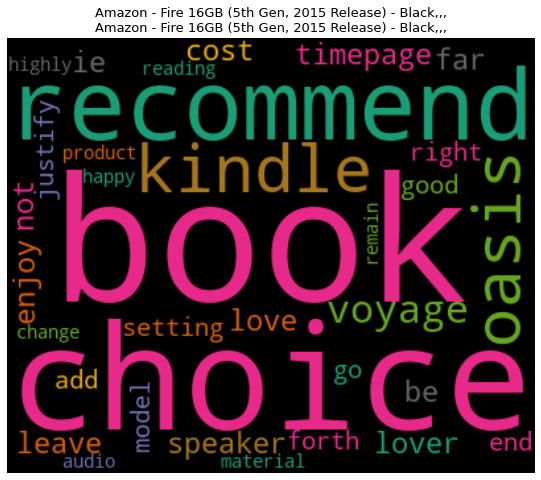

...

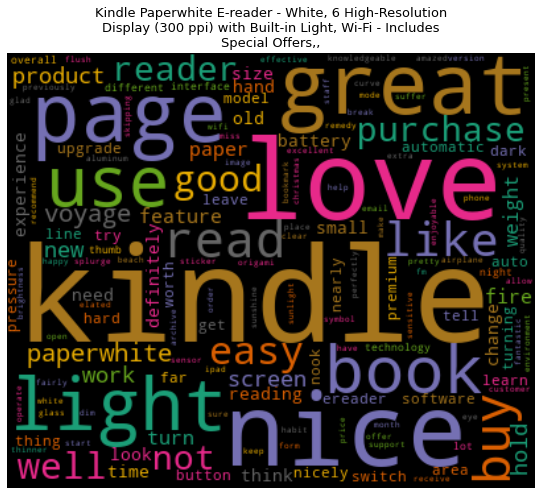

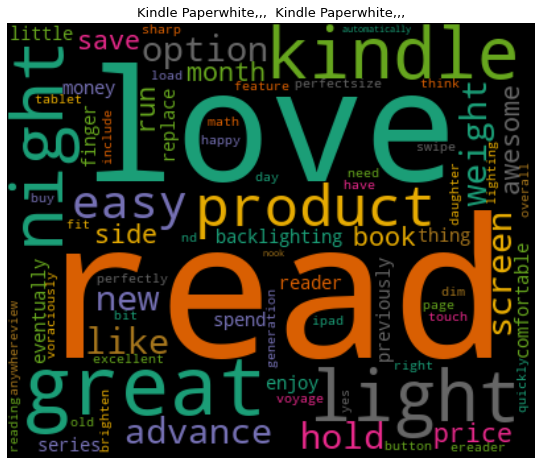

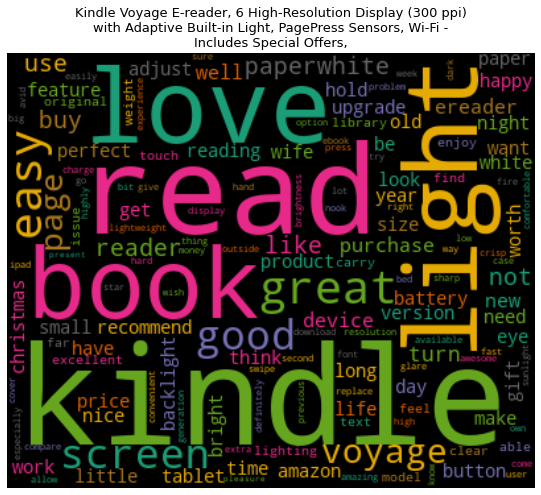

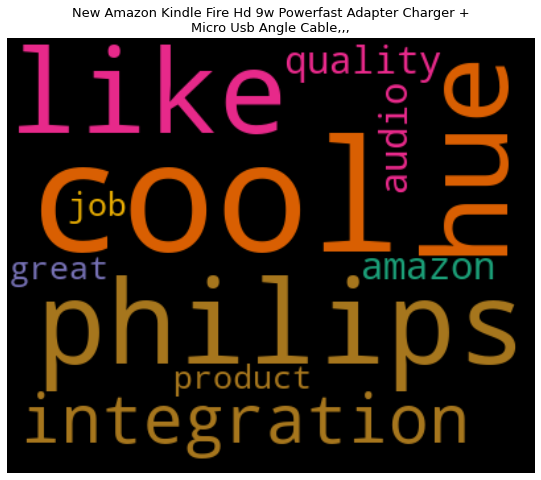

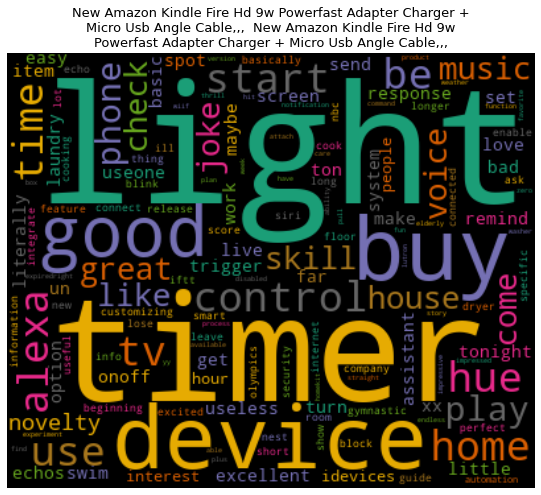

In [222]:
# Importing wordcloud for plotting word clouds and textwrap for wrapping longer text
from wordcloud import WordCloud
from textwrap import wrap

# Function for generating word clouds
def generate_wordcloud(data,title):
    wc = WordCloud(width=400, height=330, max_words=150,colormap="Dark2").generate_from_frequencies(data)
    plt.figure(figsize=(10,8))
    plt.imshow(wc, interpolation='bilinear')
    plt.axis("off")
    plt.title('\n'.join(wrap(title,60)),fontsize=13)
    plt.show()
#Transposing document term matrix
df_dtm=df_dtm.transpose()

# Plotting word cloud for each product
for index,product in enumerate(df_dtm.columns):
    generate_wordcloud(df_dtm[product].sort_values(ascending=False),product)

In [224]:
#Here, in this case, checking only the polarity, i.e., how much a text is positive or negative, is sufficient.
#We can check the polarity of a review using the TextBlob library in Python:

In [227]:
!pip install textblob

In [89]:
from textblob import TextBlob
df2['polarity']=df2['lemmatized'].apply(lambda x:TextBlob(x).sentiment.polarity)

#Let’s take a look at some of the most positive and negative reviews from the customers:

In [231]:
print("3 Random Reviews with Highest Polarity:")
for index,review in enumerate(df2.iloc[df2['polarity'].sort_values(ascending=False)[:3].index]['reviews']):
    print('Review {}:\n'.format(index+1),review)

3 Random Reviews with Highest Polarity:
Review 1:
 Perfect for reading in sunny conditions, eliminates the storage need for books in the house
Review 2:
 Excellent tablet both for reading books and for going to the web
Review 3:
 I only had a chance to download one movie and I was impressed with clarity of pic


In [233]:
print("3 Random Reviews with Lowest Polarity:")
for index,review in enumerate(df2.iloc[df2['polarity'].sort_values(ascending=True)[:3].index]['reviews']):
    print('Review {}:\n'.format(index+1),review)

3 Random Reviews with Lowest Polarity:
Review 1:
 Works just as well as my Rokus, however the interface is completely awful. Buy the fire for kodi buy a roku for everything else.
Review 2:
 Reason I wouldn't give it a full five stars is because of the fact that is so loaded down with adware for Amazon but an awful lot of that is what makes it affordable so $49 can't beat it
Review 3:
 Goodbye outrageous satellite bills...hello Amazon!


In [234]:
## plot polarities of reviews for each product and compare them. A bar graph is best suited for this purpose:

In [93]:
product_polarity_sorted=pd.DataFrame(df2.groupby('name')['polarity'].mean())

In [113]:
a=product_polarity_sorted.nlargest(5,"polarity")

a.to_excel("pl.xlsx")

In [114]:
a=pd.read_excel("pl.xlsx")

In [117]:
a

,name,polarity
0,Certified Refurbished Amazon Fire TV (Previous...,0.621
1,"Fire HD 8 Tablet with Alexa, 8 HD Display, 16 ...",0.535
2,Amazon Kindle Touch Leather Case (4th Generati...,0.533
3,Certified Refurbished Amazon Fire TV Stick (Pr...,0.500
4,New Amazon Kindle Fire Hd 9w Powerfast Adapter...,0.500


In [133]:
cc=a.iloc[:: -1]
cc

,name,polarity
4,New Amazon Kindle Fire Hd 9w Powerfast Adapter...,0.500
3,Certified Refurbished Amazon Fire TV Stick (Pr...,0.500
2,Amazon Kindle Touch Leather Case (4th Generati...,0.533
1,"Fire HD 8 Tablet with Alexa, 8 HD Display, 16 ...",0.535
0,Certified Refurbished Amazon Fire TV (Previous...,0.621


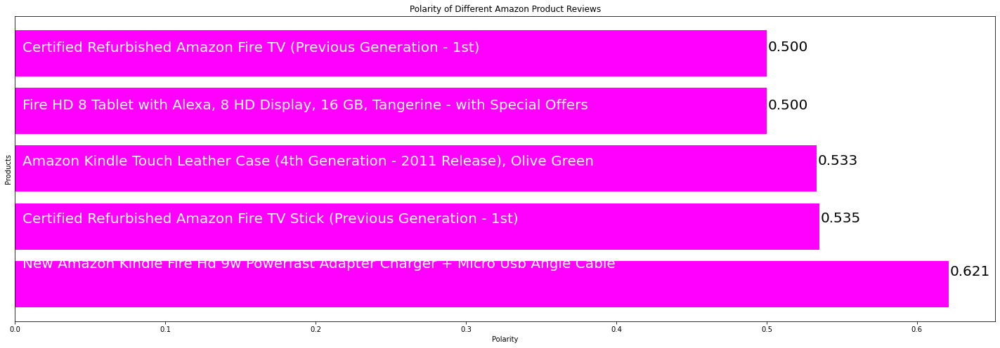

In [132]:
#product_polarity_sorted=pd.DataFrame(df2.groupby('name')['polarity'].mean().sort_values(ascending=True))
plt.figure(figsize=(25,8))
plt.xlabel('Polarity')
plt.ylabel('Products')
plt.title('Polarity of Different Amazon Product Reviews')
polarity_graph=plt.barh(np.arange(len(cc)),a['polarity'],color='magenta',)

# Writing product names on bar
for bar,product in zip(polarity_graph,cc.name):
    plt.text(0.005,bar.get_y()+bar.get_width(),'{}'.format(product),va='center',fontsize=20,color='white')

# Writing polarity values on graph
for bar,polarity in zip(polarity_graph,a['polarity']):
    plt.text(bar.get_width()+0.001,bar.get_y()+bar.get_width(),'%.3f'%polarity,va='center',fontsize=20,color='black')

plt.yticks([])
plt.show()

In [204]:
print('{} {}'.format(len(df2),len(df3)))

34660 34066


In [206]:
recommend_percentage=pd.DataFrame(((df3.groupby('name')['reviews.doRecommend'].sum()*100)/df3.groupby('name')['reviews.doRecommend'].count()).sort_values(ascending=True))

In [216]:
recommend_percentage.to_excel("re.xlsx")

In [221]:
tt=recommend_percentage[1:6]

In [209]:
b=recommend_percentage.head(5)

In [212]:
c=recommend_percentage.tail(5)
c

,reviews.doRecommend
name,
"Certified Refurbished Amazon Fire TV Stick (Previous Generation - 1st),,,\r\nCertified Refurbished Amazon Fire TV Stick (Previous Generation - 1st),,,",100.0
"Certified Refurbished Amazon Fire TV (Previous Generation - 1st),,,\r\nCertified Refurbished Amazon Fire TV (Previous Generation - 1st),,,",100.0
"New Amazon Kindle Fire Hd 9w Powerfast Adapter Charger + Micro Usb Angle Cable,,,\r\n",100.0
"Amazon Kindle Touch Leather Case (4th Generation - 2011 Release), Olive Green,,,\r\nAmazon Kindle Touch Leather Case (4th Generation - 2011 Release), Olive Green,,,",100.0
"Echo (Black),,,\r\nAmazon 9W PowerFast Official OEM USB Charger and Power Adapter for Fire Tablets and Kindle eReaders,,,",100.0


In [228]:
gg=pd.read_excel("gg.xlsx")

In [229]:
gg

,Product Name,Recommendation Indicator
0,New Amazon Kindle Fire Hd 9w Powerfast Adapter...,66.67
1,Kindle Oasis E-reader with Leather Charging Co...,83.33
2,Amazon 5W USB Official OEM Charger and Power A...,84.21
3,Amazon - Kindle Voyage - 4GB - Wi-Fi + 3G - Black,92.00
4,"Fire Kids Edition Tablet, 7 Display, Wi-Fi, 16...",93.63


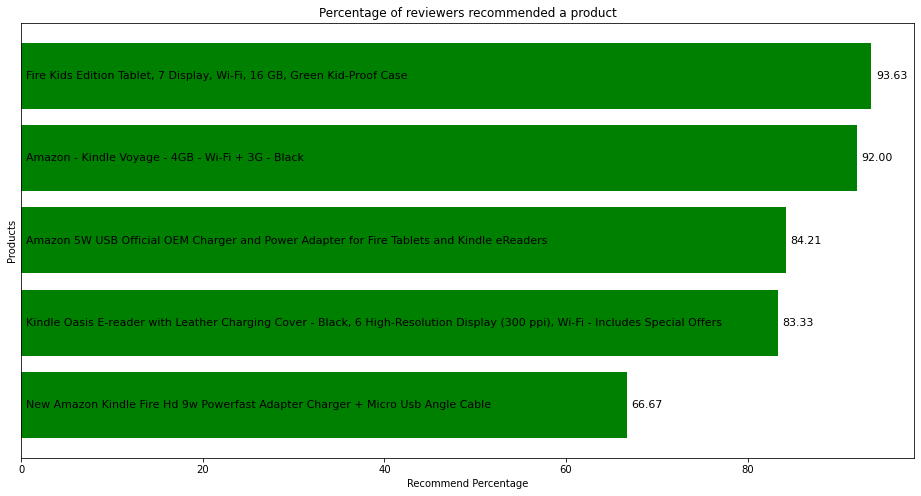

In [236]:
plt.figure(figsize=(16,8))
plt.xlabel('Recommend Percentage')
plt.ylabel('Products')
plt.title('Percentage of reviewers recommended a product')
recommend_graph=plt.barh(np.arange(len(gg["Product Name"])),gg['Recommendation Indicator'],color='green')

# Writing product names on bar
for bar,product in zip(recommend_graph,gg["Product Name"]):
    plt.text(0.5,bar.get_y()+0.4,'{}'.format(product),va='center',fontsize=11,color='black')

# Writing recommendation percentage on graph
for bar,percentage in zip(recommend_graph,gg['Recommendation Indicator']):
    plt.text(bar.get_width()+0.5,bar.get_y()+0.4,'%.2f'%percentage,va='center',fontsize=11,color='black')

plt.yticks([])
plt.show()

In [137]:
df2.groupby('name')['reviews.doRecommend'].count()

name
All-New Fire HD 8 Tablet, 8 HD Display, Wi-Fi, 16 GB - Includes Special Offers, Magenta                                                                                                                              2814
All-New Fire HD 8 Tablet, 8 HD Display, Wi-Fi, 32 GB - Includes Special Offers, Magenta                                                                                                                               146
All-New Kindle E-reader - Black, 6 Glare-Free Touchscreen Display, Wi-Fi -  Includes Special Offers,,                                                                                                                   0
Amazon - Amazon Tap Portable Bluetooth and Wi-Fi Speaker - Black,,,\r\nAmazon - Amazon Tap Portable Bluetooth and Wi-Fi Speaker - Black,,,                                                                            318
Amazon - Fire 16GB (5th Gen, 2015 Release) - Black,,,\r\nAmazon - Fire 16GB (5th Gen, 2015 Release) - Black,,,             

In [171]:
filt=df2["reviews.doRecommend"].notnull()

In [151]:
len(df2)

34660

In [166]:
df3.isnull().sum()

id                          0
name                     6526
asins                       2
brand                       0
categories                  0
keys                        0
manufacturer                0
reviews.date               39
reviews.dateAdded       10202
reviews.dateSeen            0
reviews.didPurchase     33275
reviews.doRecommend       594
reviews.id              33275
reviews.numHelpful        529
reviews.rating             33
reviews.sourceURLs          0
reviews                     1
reviews.title               5
reviews.userCity        33276
reviews.userProvince    33276
reviews.username            2
cleaned                     0
lemmatized                  0
polarity                    0
dtype: int64

In [172]:
df3=df2.loc[filt]

In [173]:
len(df3)

34066

In [174]:
df3["reviews.doRecommend"].value_counts()

True     32682
False     1384
Name: reviews.doRecommend, dtype: int64

In [175]:
df3.groupby('name')['reviews.doRecommend'].count()

name
All-New Fire HD 8 Tablet, 8 HD Display, Wi-Fi, 16 GB - Includes Special Offers, Magenta                                                                                                                              2814
All-New Fire HD 8 Tablet, 8 HD Display, Wi-Fi, 32 GB - Includes Special Offers, Magenta                                                                                                                               146
Amazon - Amazon Tap Portable Bluetooth and Wi-Fi Speaker - Black,,,\r\nAmazon - Amazon Tap Portable Bluetooth and Wi-Fi Speaker - Black,,,                                                                            318
Amazon - Fire 16GB (5th Gen, 2015 Release) - Black,,,\r\nAmazon - Fire 16GB (5th Gen, 2015 Release) - Black,,,                                                                                                          5
Amazon - Kindle Voyage - 4GB - Wi-Fi + 3G - Black,,,\r\nAmazon - Kindle Voyage - 4GB - Wi-Fi + 3G - Black,,,               

In [176]:
recommend_percentage=pd.DataFrame(((df3.groupby('name')['reviews.doRecommend'].sum()*100)/df3.groupby('name')['reviews.doRecommend'].count()))


In [183]:
recommend_percentage.columns

Index(['reviews.doRecommend'], dtype='object')

In [187]:
a=(recommend_percentage["reviews.doRecommend"].astype(float))

In [1]:
#####################  Advanced EDA done ####################
#####################                    ####################

# Start - model 

#### Combination model(BERT +HBN) -- Model and visualization 

In [2]:
# Autuencoder
import keras
from keras.layers import Input, Dense
from keras.models import Model
from sklearn.model_selection import train_test_split
import warnings
warnings.filterwarnings('ignore')


class Autoencoder:
    """
    Autoencoder for learning latent space representation
    architecture simplified for only one hidden layer
    """

    def __init__(self, latent_dim=32, activation='relu', epochs=200, batch_size=128):
        self.latent_dim = latent_dim
        self.activation = activation
        self.epochs = epochs
        self.batch_size = batch_size
        self.autoencoder = None
        self.encoder = None
        self.decoder = None
        self.his = None

    def _compile(self, input_dim):
        """
        compile the computational graph
        """
        input_vec = Input(shape=(input_dim,))
        encoded = Dense(self.latent_dim, activation=self.activation)(input_vec)
        decoded = Dense(input_dim, activation=self.activation)(encoded)
        self.autoencoder = Model(input_vec, decoded)
        self.encoder = Model(input_vec, encoded)
        encoded_input = Input(shape=(self.latent_dim,))
        decoder_layer = self.autoencoder.layers[-1]
        self.decoder = Model(encoded_input, self.autoencoder.layers[-1](encoded_input))
        self.autoencoder.compile(optimizer='adam', loss=keras.losses.mean_squared_error)

    def fit(self, X):
        if not self.autoencoder:
            self._compile(X.shape[1])
        X_train, X_test = train_test_split(X)
        self.his = self.autoencoder.fit(X_train, X_train,
                                        epochs=200,
                                        batch_size=128,
                                        shuffle=True,
                                        validation_data=(X_test, X_test), verbose=0)

### Evaluation utility class

In [ ]:
## Utils class 

from collections import Counter
from sklearn.metrics import silhouette_score
import umap
import matplotlib.pyplot as plt
from wordcloud import WordCloud
from gensim.models.coherencemodel import CoherenceModel
import numpy as np
import os


def get_topic_words(token_lists, labels, k=None):
    """
    get top words within each topic from clustering results
    """
    if k is None:
        k = len(np.unique(labels))
    topics = ['' for _ in range(k)]
    for i, c in enumerate(token_lists):
        topics[labels[i]] += (' ' + ' '.join(c))
    word_counts = list(map(lambda x: Counter(x.split()).items(), topics))
    # get sorted word counts
    word_counts = list(map(lambda x: sorted(x, key=lambda x: x[1], reverse=True), word_counts))
    # get topics
    topics = list(map(lambda x: list(map(lambda x: x[0], x[:10])), word_counts))

    return topics

def get_coherence(model, token_lists, measure='c_v'):
    """
    Get model coherence from gensim.models.coherencemodel
    :param model: Topic_Model object
    :param token_lists: token lists of docs
    :param topics: topics as top words
    :param measure: coherence metrics
    :return: coherence score
    """
    if model.method == 'LDA':
        cm = CoherenceModel(model=model.ldamodel, texts=token_lists, corpus=model.corpus, dictionary=model.dictionary,
                            coherence=measure)
    else:
        topics = get_topic_words(token_lists, model.cluster_model.labels_)
        cm = CoherenceModel(topics=topics, texts=token_lists, corpus=model.corpus, dictionary=model.dictionary,
                            coherence=measure)
    return cm.get_coherence()

def get_silhouette(model):
    """
    Get silhouette score from model
    :param model: Topic_Model object
    :return: silhouette score
    """
    if model.method == 'LDA':
        return
    lbs = model.cluster_model.labels_
    vec = model.vec[model.method]
    return silhouette_score(vec, lbs)

def plot_proj(embedding, lbs):
    """
    Plot UMAP embeddings
    :param embedding: UMAP (or other) embeddings
    :param lbs: labels
    """
    n = len(embedding)
    counter = Counter(lbs)
    for i in range(len(np.unique(lbs))):
        plt.plot(embedding[:, 0][lbs == i], embedding[:, 1][lbs == i], '.', alpha=0.5,
                 label='cluster {}: {:.2f}%'.format(i, counter[i] / n * 100))
    plt.legend(loc = 'best')
    plt.grid(color ='grey', linestyle='-',linewidth = 0.25)


def visualize(model):
    """
    Visualize the result for the topic model by 2D embedding (UMAP)
    :param model: Topic_Model object
    """
    if model.method == 'LDA':
        return
    reducer = umap.UMAP()
    print('Calculating UMAP projection ...')
    vec_umap = reducer.fit_transform(model.vec[model.method])
    print('Calculating UMAP projection. Done!')
    plot_proj(vec_umap, model.cluster_model.labels_)
    dr = '/working/contextual_topic_identification/docs/images/{}/{}'.format(model.method, model.id)
    if not os.path.exists(dr):
        os.makedirs(dr)
    plt.savefig('/working/2D_vis')

def get_wordcloud(model, token_lists, topic):
    """
    Get word cloud of each topic from fitted model
    :param model: Topic_Model object
    :param sentences: preprocessed sentences from docs
    """
    if model.method == 'LDA':
        return
    print('Getting wordcloud for topic {} ...'.format(topic))
    lbs = model.cluster_model.labels_
    tokens = ' '.join([' '.join(_) for _ in np.array(token_lists)[lbs == topic]])

    wordcloud = WordCloud(width=800, height=560,
                          background_color='white', collocations=False,
                          min_font_size=10).generate(tokens)

    # plot the WordCloud image
    plt.figure(figsize=(8, 5.6), facecolor=None)
    plt.imshow(wordcloud)
    plt.axis("off")
    plt.tight_layout(pad=0)
    dr = '/working/{}/{}'.format(model.method, model.id)
    if not os.path.exists(dr):
        os.makedirs(dr)
    plt.savefig('/working' + '/Topic' + str(topic) + '_wordcloud')
    print('Getting wordcloud for topic {}. Done!'.format(topic))

### Model Building 

In [5]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.cluster import KMeans
from gensim import corpora
import gensim
import numpy as np
#from Autoencoder import *
#from preprocess import *
from datetime import datetime


def preprocess(docs, samp_size=None):
    """
    Preprocess the data
    """
    if not samp_size:
        samp_size = 100

    print('Preprocessing raw texts ...')
    n_docs = len(docs)
    sentences = []  # sentence level preprocessed
    token_lists = []  # word level preprocessed
    idx_in = []  # index of sample selected
    #     samp = list(range(100))
    samp = np.random.choice(n_docs, samp_size)
    for i, idx in enumerate(samp):
        sentence = preprocess_sent(docs[idx])
        token_list = preprocess_word(sentence)
        if token_list:
            idx_in.append(idx)
            sentences.append(sentence)
            token_lists.append(token_list)
        print('{} %'.format(str(np.round((i + 1) / len(samp) * 100, 2))), end='\r')
    print('Preprocessing raw texts. Done!')
    return sentences, token_lists, idx_in


# define model object
class Topic_Model:
    def __init__(self, k=10, method='TFIDF'):
        """
        :param k: number of topics
        :param method: method chosen for the topic model
        """
        if method not in {'TFIDF', 'LDA', 'BERT', 'LDA_BERT'}:
            raise Exception('Invalid method!')
        self.k = k
        self.dictionary = None
        self.corpus = None
        #         self.stopwords = None
        self.cluster_model = None
        self.ldamodel = None
        self.vec = {}
        self.gamma = 15  # parameter for relative importance of BERT vector
        self.method = method
        self.AE = None
        self.id = method + '_' + datetime.now().strftime("%Y_%m_%d_%H_%M_%S")

    def vectorize(self, sentences, token_lists, method=None):
        """
        Get vecotr representations from selected methods
        """
        # Default method
        if method is None:
            method = self.method

        # turn tokenized documents into a id <-> term dictionary
        self.dictionary = corpora.Dictionary(token_lists)
        # convert tokenized documents into a document-term matrix
        self.corpus = [self.dictionary.doc2bow(text) for text in token_lists]

        if method == 'TFIDF':
            print('Getting vector representations for TF-IDF ...')
            tfidf = TfidfVectorizer()
            vec = tfidf.fit_transform(sentences)
            print('Getting vector representations for TF-IDF. Done!')
            return vec

        elif method == 'LDA':
            print('Getting vector representations for LDA ...')
            if not self.ldamodel:
                self.ldamodel = gensim.models.ldamodel.LdaModel(self.corpus, num_topics=self.k, id2word=self.dictionary,
                                                                passes=20)

            def get_vec_lda(model, corpus, k):
                """
                Get the LDA vector representation (probabilistic topic assignments for all documents)
                :return: vec_lda with dimension: (n_doc * n_topic)
                """
                n_doc = len(corpus)
                vec_lda = np.zeros((n_doc, k))
                for i in range(n_doc):
                    # get the distribution for the i-th document in corpus
                    for topic, prob in model.get_document_topics(corpus[i]):
                        vec_lda[i, topic] = prob

                return vec_lda

            vec = get_vec_lda(self.ldamodel, self.corpus, self.k)
            print('Getting vector representations for LDA. Done!')
            return vec

        elif method == 'BERT':

            print('Getting vector representations for BERT ...')
            from sentence_transformers import SentenceTransformer
            model = SentenceTransformer('bert-base-nli-max-tokens')
            vec = np.array(model.encode(sentences, show_progress_bar=True))
            print('Getting vector representations for BERT. Done!')
            return vec

             
        elif method == 'LDA_BERT':
        #else:
            vec_lda = self.vectorize(sentences, token_lists, method='LDA')
            vec_bert = self.vectorize(sentences, token_lists, method='BERT')
            vec_ldabert = np.c_[vec_lda * self.gamma, vec_bert]
            self.vec['LDA_BERT_FULL'] = vec_ldabert
            if not self.AE:
                self.AE = Autoencoder()
                print('Fitting Autoencoder ...')
                self.AE.fit(vec_ldabert)
                print('Fitting Autoencoder Done!')
            vec = self.AE.encoder.predict(vec_ldabert)
            return vec

   #=============================================================================================================== 
   #===============================================================================================================     

    def fit(self, sentences, token_lists, method=None, m_clustering=None):
        """
        Fit the topic model for selected method given the preprocessed data
        :docs: list of documents, each doc is preprocessed as tokens
        :return:
        """
        # Default method
        if method is None:
            method = self.method
        # Default clustering method
        if m_clustering is None:
            m_clustering = KMeans

        # turn tokenized documents into a id <-> term dictionary
        if not self.dictionary:
            self.dictionary = corpora.Dictionary(token_lists)
            # convert tokenized documents into a document-term matrix
            self.corpus = [self.dictionary.doc2bow(text) for text in token_lists]

        ####################################################
        #### Getting ldamodel or vector representations ####
        ####################################################

        if method == 'LDA':
            if not self.ldamodel:
                print('Fitting LDA ...')
                self.ldamodel = gensim.models.ldamodel.LdaModel(self.corpus, num_topics=self.k, id2word=self.dictionary,
                                                                passes=20)
                print('Fitting LDA Done!')
        else:
            print('Clustering embeddings ...')
            self.cluster_model = m_clustering(self.k)
            self.vec[method] = self.vectorize(sentences, token_lists, method)
            self.cluster_model.fit(self.vec[method])
            print('Clustering embeddings. Done!')

            
    def predict(self, sentences, token_lists, out_of_sample=None):
        """
        Predict topics for new_documents
        """
        # Default as False
        out_of_sample = out_of_sample is not None

        if out_of_sample:
            corpus = [self.dictionary.doc2bow(text) for text in token_lists]
            if self.method != 'LDA':
                vec = self.vectorize(sentences, token_lists)
                print(vec)
        else:
            corpus = self.corpus
            vec = self.vec.get(self.method, None)

        if self.method == "LDA":
            lbs = np.array(list(map(lambda x: sorted(self.ldamodel.get_document_topics(x),
                                                     key=lambda x: x[1], reverse=True)[0][0],
                                    corpus)))
        else:
            lbs = self.cluster_model.predict(vec)
        return lbs

### Model Training 

In [6]:
import pandas as pd
import pickle
import matplotlib.pyplot as plt

import warnings
warnings.filterwarnings('ignore', category=Warning)

import argparse

#def model(): #:if __name__ == '__main__':

def main():
    
    
    method = "LDA_BERT"
    samp_size = 50000
    ntopic = 10
    data = df 
    data = data.fillna('')  # only the comments has NaN's
    rws = data["reviews.text"]
    sentences, token_lists, idx_in = preprocess(rws, samp_size=samp_size)
    # Define the topic model object
    #tm = Topic_Model(k = 10), method = TFIDF)
    tm = Topic_Model(k = ntopic, method = method)
    # Fit the topic model by chosen method
    tm.fit(sentences, token_lists)
    # Evaluate using metrics
    with open("A:/MLAI_MSC/ljmu_implementation/{}.file".format(tm.id), "wb") as f:
        pickle.dump(tm, f, pickle.HIGHEST_PROTOCOL)

    print('Coherence:', get_coherence(tm, token_lists, 'c_v'))
    print('Silhouette Score:', get_silhouette(tm))
    # visualize and save img
    visualize(tm)
    for i in range(tm.k):
        get_wordcloud(tm, token_lists, i)
        

## Testing block wise

In [7]:
method = "LDA_BERT"
samp_size = 50000
ntopic = 10
tm = Topic_Model(k = ntopic, method = method)

In [55]:
print('Coherence:', get_coherence(tm, token_lists, 'c_v'))

Coherence: 0.5496345693789357


In [135]:
tm.vec[tm.method]

array([[1.2946855 , 1.1354343 , 1.0201577 , ..., 0.9011631 , 0.9610013 ,
        0.9861969 ],
       [1.0226657 , 2.5000274 , 2.6741967 , ..., 1.0832403 , 1.7671522 ,
        0.9105332 ],
       [0.48103935, 0.82938546, 2.9431663 , ..., 0.71465003, 1.0022316 ,
        1.4697872 ],
       ...,
       [1.0378436 , 1.1296481 , 2.8022385 , ..., 1.2938969 , 0.8640089 ,
        0.45214146],
       [1.0761591 , 1.3032738 , 1.3532096 , ..., 1.6277261 , 2.3830435 ,
        0.4933998 ],
       [2.0752528 , 0.1631802 , 1.9800515 , ..., 1.6767578 , 0.27126133,
        1.091656  ]], dtype=float32)

In [60]:
tm.vec[tm.method].shape

(49412, 32)

In [61]:
a=tm.vec[tm.method]

In [62]:
a

array([[0.73372924, 2.404734  , 0.        , ..., 1.6931958 , 1.3303753 ,
        1.5595963 ],
       [1.0261874 , 2.1913884 , 0.        , ..., 1.4619614 , 2.3739743 ,
        0.3035325 ],
       [1.3853225 , 0.9334614 , 0.        , ..., 1.6659182 , 0.5552419 ,
        1.3221092 ],
       ...,
       [0.5562809 , 2.021404  , 0.        , ..., 1.9636282 , 1.9187576 ,
        0.501403  ],
       [0.86977184, 1.1216385 , 0.        , ..., 1.8582575 , 1.5078406 ,
        1.0172724 ],
       [0.9637596 , 2.639211  , 0.        , ..., 1.4448974 , 0.9449724 ,
        1.6879132 ]], dtype=float32)

In [58]:
from sklearn.preprocessing import StandardScaler

In [149]:
scaled_data = StandardScaler().fit_transform(a)

Calculating UMAP projection ...
Calculating UMAP projection. Done!


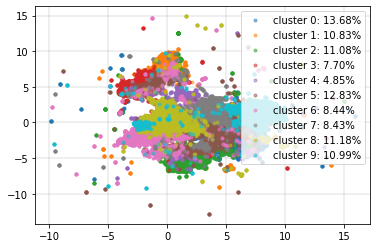

In [63]:
visualize(tm)

Getting wordcloud for topic 0 ...
Getting wordcloud for topic 0. Done!
Getting wordcloud for topic 1 ...
Getting wordcloud for topic 1. Done!
Getting wordcloud for topic 2 ...
Getting wordcloud for topic 2. Done!
Getting wordcloud for topic 3 ...
Getting wordcloud for topic 3. Done!
Getting wordcloud for topic 4 ...
Getting wordcloud for topic 4. Done!
Getting wordcloud for topic 5 ...
Getting wordcloud for topic 5. Done!
Getting wordcloud for topic 6 ...
Getting wordcloud for topic 6. Done!
Getting wordcloud for topic 7 ...
Getting wordcloud for topic 7. Done!
Getting wordcloud for topic 8 ...
Getting wordcloud for topic 8. Done!
Getting wordcloud for topic 9 ...
Getting wordcloud for topic 9. Done!


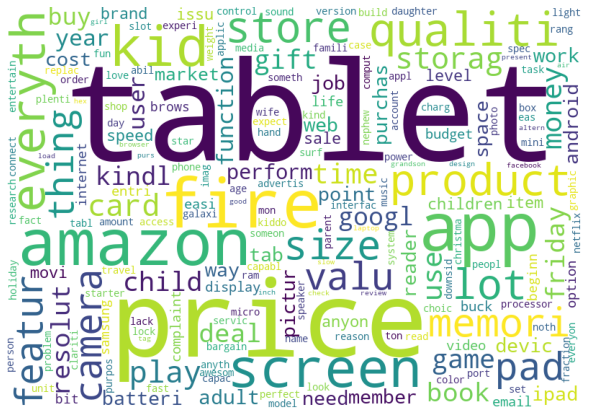

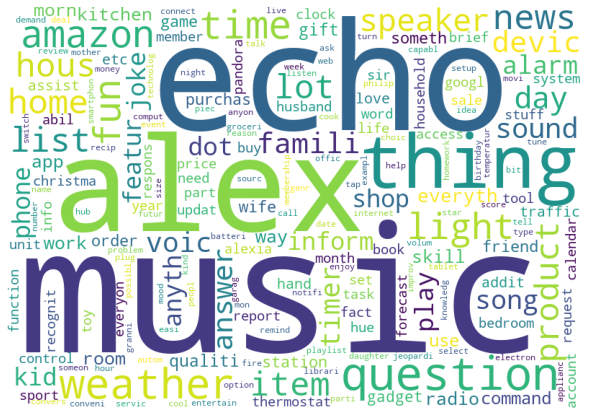

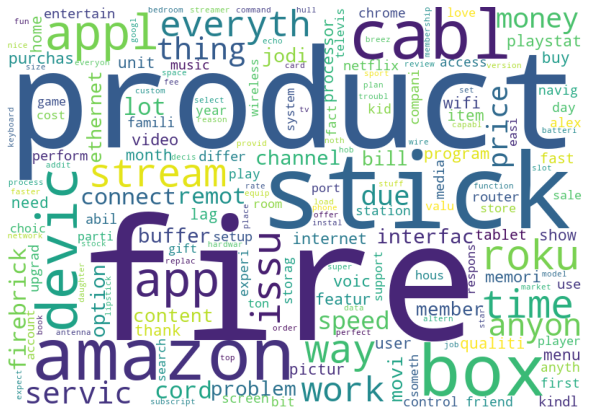

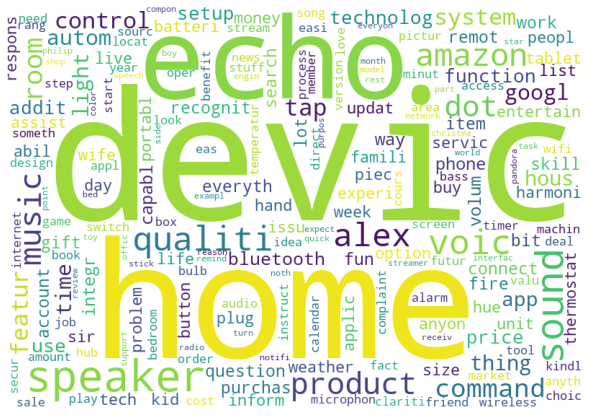

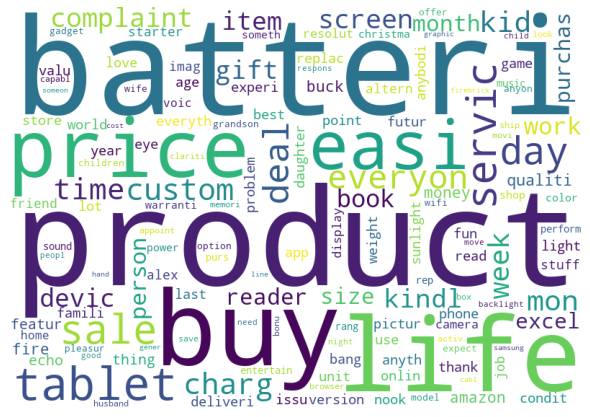

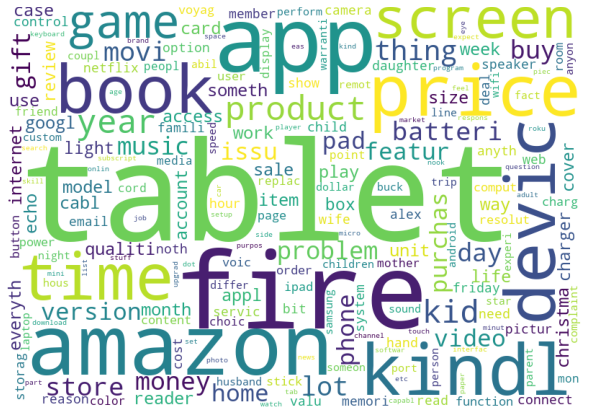

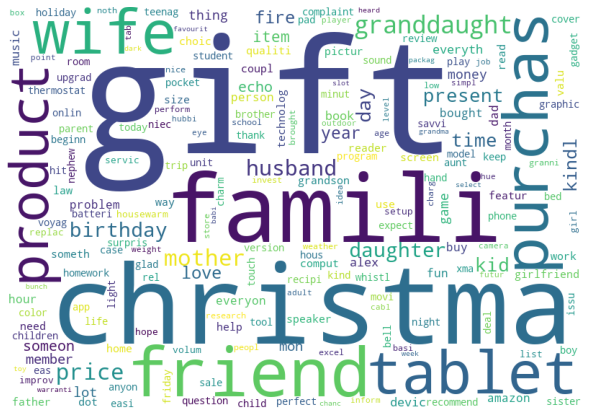

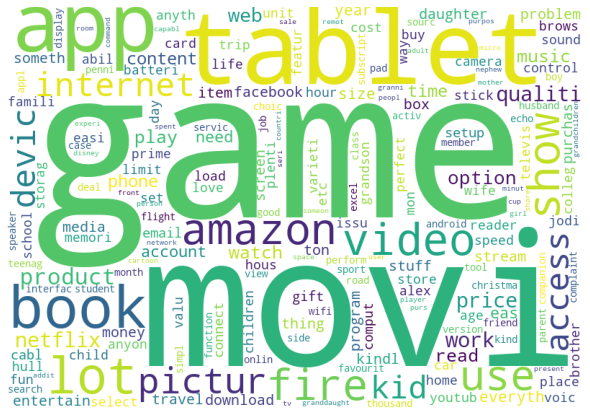

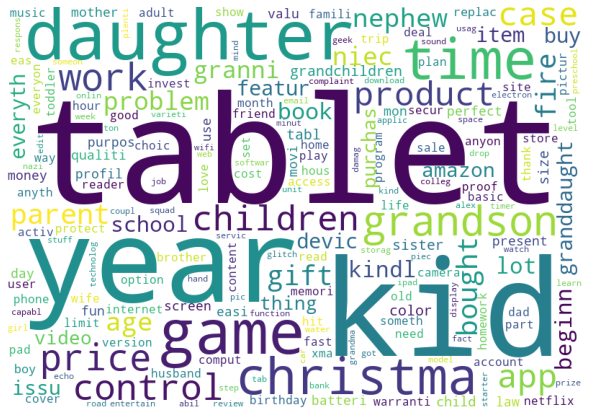

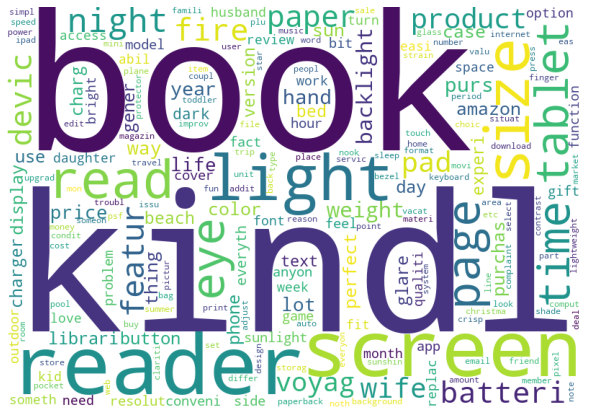

In [64]:
for i in range(tm.k):
    get_wordcloud(tm, token_lists, i)

# END